In [ ]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import requests
import matplotlib.image as mpimg

from urllib.parse import urlencode

%config InlineBackend.figure_format='retina'

In [ ]:
base_url = 'https://cloud-api.yandex.net/v1/disk/public/resources/download?'
public_key = 'https://disk.yandex.ru/d/kZ4U3l9vqLTX4w'

final_url = base_url + urlencode(dict(public_key=public_key))
response = requests.get(final_url)
download_url = response.json()['href']

download_response = requests.get(download_url)
with open('karta.zip', 'wb') as f:
    f.write(download_response.content)

In [ ]:
! unzip karta.zip

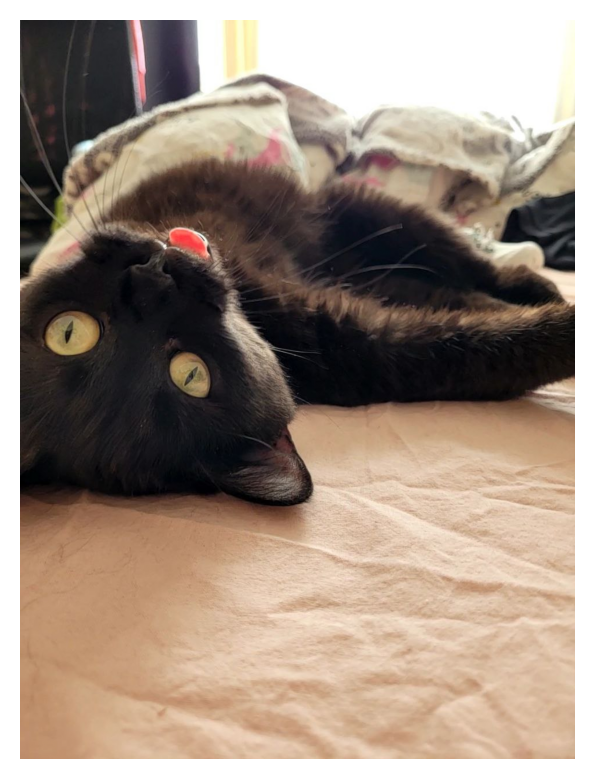

In [ ]:
i = 8
img = mpimg.imread(f'{i}.jpg')
img = img / np.linalg.norm(img.reshape(-1, 3), ord=np.inf, axis=0, keepdims=True).reshape(1, 1, 3)
plt.imshow(img)
plt.axis("off");

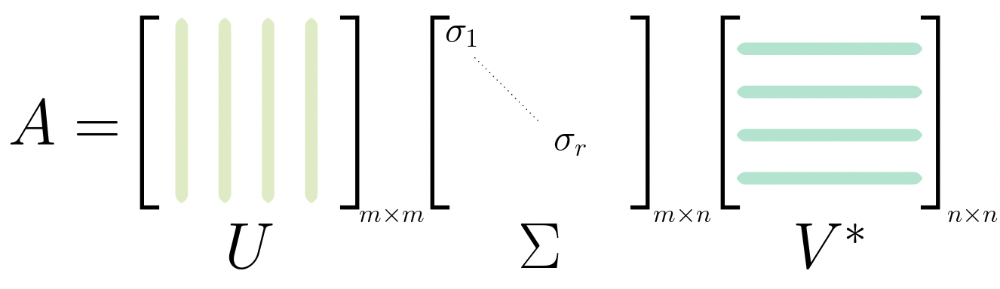

##HOW TO COMPUTE? (Naive approach)

$$
\overline{A} = U Σ V^{\top}
$$

$$
\overline{A}^{\top}\overline{A} = U \lambda(\overline{A}^{\top}\overline{A}) U^{\top}\\
\overline{A}\overline{A}^{\top} = V \lambda(\overline{A} \overline{A}^{\top}) V^{\top}\\
$$


Naive approach is not very stable so keep in mind that
\begin{equation}
  A V = U \Sigma
\end{equation}



In [ ]:
def svd_(A):
  ATA = A.T @ A

  AAT = A @ A.T
  sigma_21, V = np.linalg.eig(ATA) #QR_algorithm(ATA, kqr)
  sigma_22, U = np.linalg.eig(AAT) #QR_algorithm(AAT, kqr)


  ids_21 = np.argsort(-sigma_21)
  V = V[:, ids_21]
  sigma_21 = sigma_21[ids_21]


  ids_22 = np.argsort(-sigma_22)
  U = U[:, ids_22]
  sigma_22 = sigma_22[ids_22]


  l = 0
  if len(sigma_22)> len(sigma_21):
    sigma_k = np.diag(np.sqrt(np.abs(sigma_21)))
    l = len(sigma_21)
    l2 = U.shape[0]
    sigma_k = np.pad(sigma_k, ( (0,l2-l), (0,0)))
  else:
    sigma_k = np.diag(np.sqrt(np.abs(sigma_22)))
    l = len(sigma_22)
    l2 = V.shape[0]

    sigma_k = np.pad(sigma_k, ( (0,0), (0,l2-l)))
  Uk = U
  Vk = V

  signs_right = np.sign((A@ Vk)[0,:])
  multipliers = 2*((signs_right != np.sign((Uk @ sigma_k)[0, :])) * (-1) + 1/2)


  Vk = Vk * multipliers.reshape(1, -1)



  return Uk, sigma_k, Vk.T

In [ ]:
transformed = []

for i in range(3):
  print(i)
  U, sigma, V = ...
  print(np.allclose(U@sigma@V, img[:, :, i], rtol =1e-7))
  print(np.linalg.norm((U@sigma@V - img[:, :, i]).reshape(-1,), ord=np.inf))
  print("_____")
  transformed += [[U, sigma, V]]

0
True
3.2928701987344766e-09
_____
1
True
2.310248881087773e-09
_____
2
True
8.495416592424476e-10
_____


In [ ]:
transformed

NameError: ignored

<ipython-input-7-0911eff9fce0>:6: ComplexWarning: Casting complex values to real discards the imaginary part
  img_tr[:, :, i] = uk[:,:mode] @ sk[:mode, :mode]  @ vk[:mode, :]


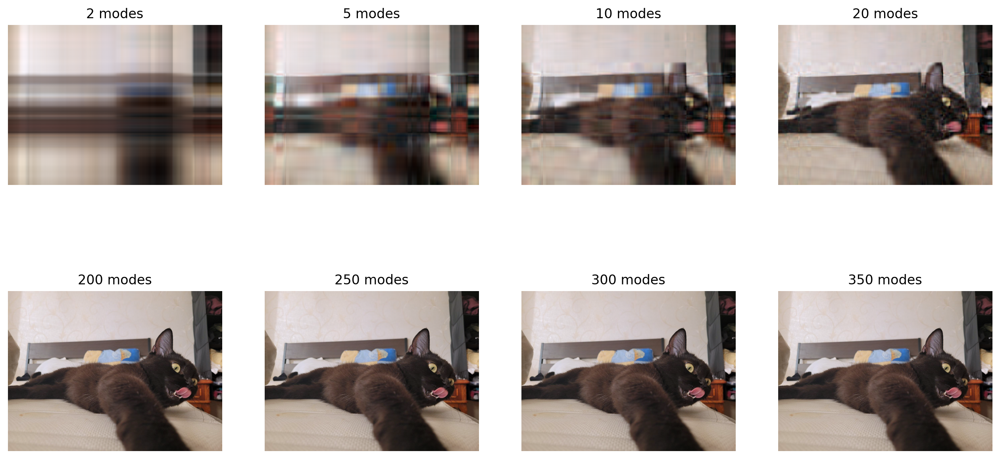

In [ ]:
img_tr = np.copy(img)
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
for mode, a in zip([2,5,10, 20, 200, 250, 300, 350], ax.reshape(-1, )):
  for i in range(3):
    uk, sk, vk =....
  img_tr = abs(img_tr) / np.max(img_tr)
  a.set_title(f'{mode} modes')
  a.imshow(img_tr)
  a.axis('off')

# GENERALIZATION OF SVD FOR TENSORS


## Tucker decomposition

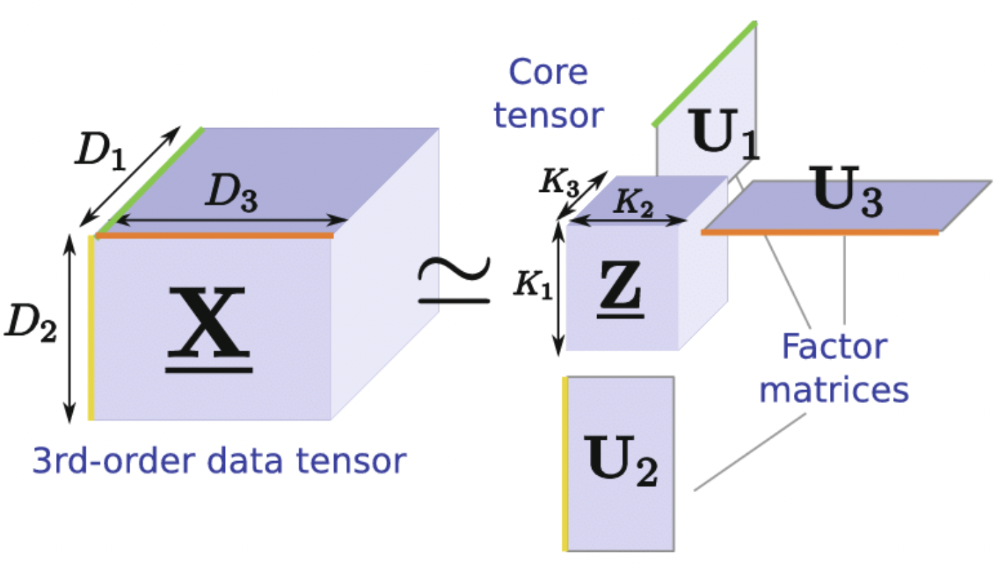

Suppose we have a 3D tensor A ∈ $C^{R1 × R2 × R3}$

* for $i$ in $[0,1,2]$:
    
      1. Construct the mode-m flattening $A_m$
      2. Compute the (compact) singular value decomposition $A_m = U_m S_m V^T_m$, and store the left singular vectors
*Compute the core tensor $S$ via the multilinear multiplication $S = A \times U_1 \times U2 \times U3$



# What is Mode-m flattening?

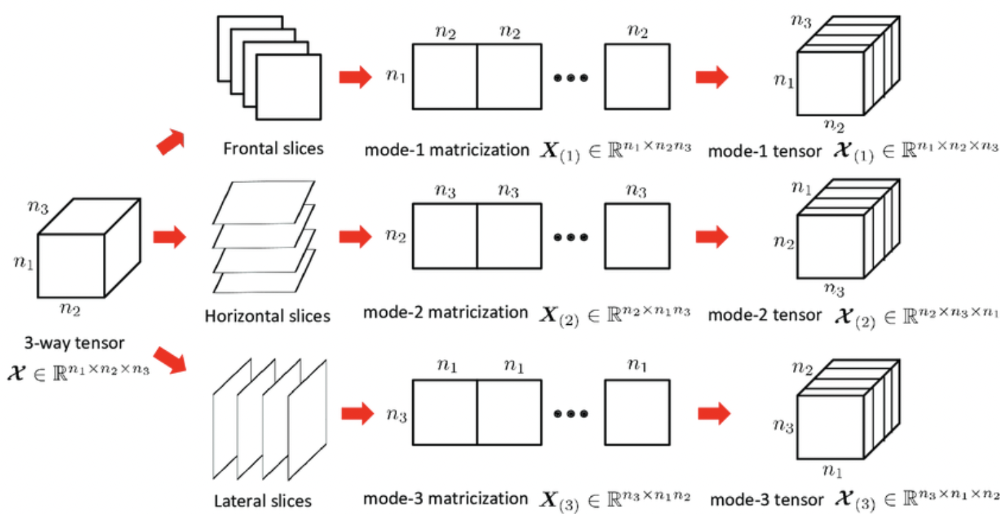

In [ ]:

from sklearn.decomposition import TruncatedSVD

def tucker(A, rank):
  n1, n2, n3 = A.shape
  u1, s1, v1 = np.linalg.svd(np.reshape(A, (n1, -1)), full_matrices=False)
  u1 = u1[:, :rank]
  u2, s1, v1 = np.linalg.svd(np.reshape(np.transpose(A, [1,2,0]), (n2, -1)), full_matrices=False)
  u2 = u2[:, :rank]
  u3, s1, v1 = np.linalg.svd(np.reshape(np.transpose(A, [2,0, 1]), (n3, -1)), full_matrices=False)
  core  = np.einsum('ia, jb, kc, ijk -> abc', u1, u2, u3, A, optimize=True)
  return u1, u2, u3, core

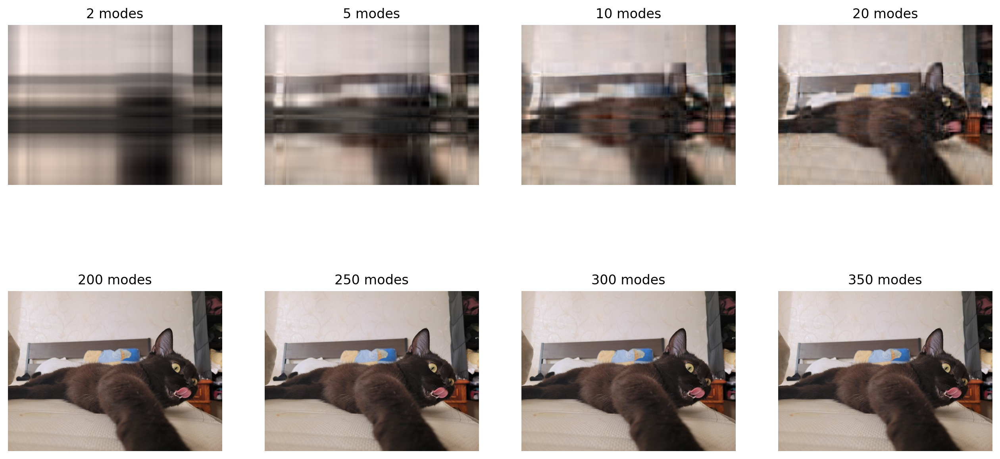

In [ ]:
img_tr = np.copy(img)
fig, ax = plt.subplots(2, 4, figsize=(16, 8))
for mode, a in zip([2,5,10,20, 200, 250, 300, 350], ax.reshape(-1, )):
  u1, u2, u3, core =...
  pic = ...
  img_tr = abs(img_tr) / np.max(img_tr)
  a.set_title(f'{mode} modes')
  a.imshow(pic)
  a.axis('off')

In [ ]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
# you will need internet connection for this block
csv_url = "https://raw.githubusercontent.com/hsu-ai-course/hsu.ai/master/code/datasets/ml/nutrition.csv"
dataset = pd.read_csv(csv_url)

# there are no (0) saturated fats in vegetables, that's why we replace N/A values with 0
dataset = dataset.fillna(0)

In [ ]:
classes_list = dataset["Food Type"][1:].values
names = dataset["Food and Serving"][1:].values
dimensions = dataset.columns[1:]

print("Names:", *names[:5], "...", sep=" | ")
print()
print("Classes:", *set(classes_list), sep=" | ")
print()
print("Dimensions:", *dimensions[:5], "...", sep=" | ")

dataset.head()

Names: | Asparagus, 5 spears (93 g/3.3 oz) | Bell Pepper, 1 medium (148 g/5.3 oz) | Broccoli, 1 medium stalk (148 g/5.3 oz) | Carrot, 1 carrot, 7" long, 1 1/4" diameter (78 g/2.8 oz) | Cauliflower, 1/6 medium head (99 g/3.5 oz) | ...

Classes: | Seafood, Serving Size (84 g/3 oz) | Vegetables, Serving Size (gram weight/ ounce weight) | Fruits Serving Size (gram weight/ounce weight)

Dimensions: | Calories | Calories from Fat | Total Fat 1 | Total Fat 2 | Sodium 1 | ...


,Food and Serving,Calories,Calories from Fat,Total Fat 1,Total Fat 2,Sodium 1,Sodium 2,Potassium 1,Potassium 2,Total Carbo-hydrate 1,...,Protein,Vitamin A,Vitamin C,Calcium,Iron,Saturated Fat,Saturated Fat 2,Chole-sterol 1,Chole-sterol 2,Food Type
0,0,0.0,0.0,(g),(%DV),(g),(%DV),(g),(%DV),(g),...,(g),(%DV),(%DV),(%DV),(%DV),(%DV),(mg),(%DV),(mg),0
1,"Asparagus, 5 spears (93 g/3.3 oz)",20.0,0.0,0,0,0,0,230,7,4,...,2,10,15,2,2,0,0,0,0,"Vegetables, Serving Size (gram weight/ ounce w..."
2,"Bell Pepper, 1 medium (148 g/5.3 oz)",25.0,0.0,0,0,40,2,220,6,6,...,1,4,190,2,4,0,0,0,0,"Vegetables, Serving Size (gram weight/ ounce w..."
3,"Broccoli, 1 medium stalk (148 g/5.3 oz)",45.0,0.0,0.5,1,80,3,460,13,8,...,4,6,220,6,6,0,0,0,0,"Vegetables, Serving Size (gram weight/ ounce w..."
4,"Carrot, 1 carrot, 7"" long, 1 1/4"" diameter (78...",30.0,0.0,0,0,60,3,250,7,7,...,1,110,10,2,2,0,0,0,0,"Vegetables, Serving Size (gram weight/ ounce w..."


In [ ]:
classes = list(set(classes_list))
colors = ["red", "green", "blue", "black", "magenta"]
class_colors = {}
for i in range(len(classes)):
    class_colors[classes[i]] = colors[i % len(colors)]

print(class_colors)
color_list = [class_colors[a] for a in classes_list]

{'Seafood, Serving Size (84 g/3 oz)': 'red', 'Vegetables, Serving Size (gram weight/ ounce weight)': 'green', 'Fruits Serving Size (gram weight/ounce weight)': 'blue'}


In [ ]:
def show_points_2d(X, Y, xaxis, yaxis):
    global names, classes_list, class_colors
    plt.figure(figsize=(15,10))
    plt.xlabel(xaxis)
    plt.ylabel(yaxis)
    classes = set()
    for x, y, name, label in zip(X, Y, names, classes_list):
        if not label in classes:
            plt.plot([x], [y], "o", markersize=20, color=class_colors[label], label=label)
            classes.add(label)
        else:
            plt.plot([x], [y], "o", markersize=20, color=class_colors[label])
        plt.text(x, y, name)
    plt.legend()
    plt.axvline(0)
    plt.axhline(0)
    plt.show()

def show_points_3d(X, Y, Z):
    global color_list
    fig = plt.figure(figsize=(15, 10))
    ax = fig.add_subplot(111, projection='3d')
    for x, y, z, color in zip(X, Y, Z, color_list):
        ax.scatter([x], [y], [z], marker='o', color=color)
    plt.show()

def show_matrix(A, xaxis, yaxis):
    plt.figure(figsize=(15,10))
    plt.xlabel(xaxis)
    plt.ylabel(yaxis)
    plt.imshow(A)
    plt.show()

Raw matrix values, columns are objects (61, 22)


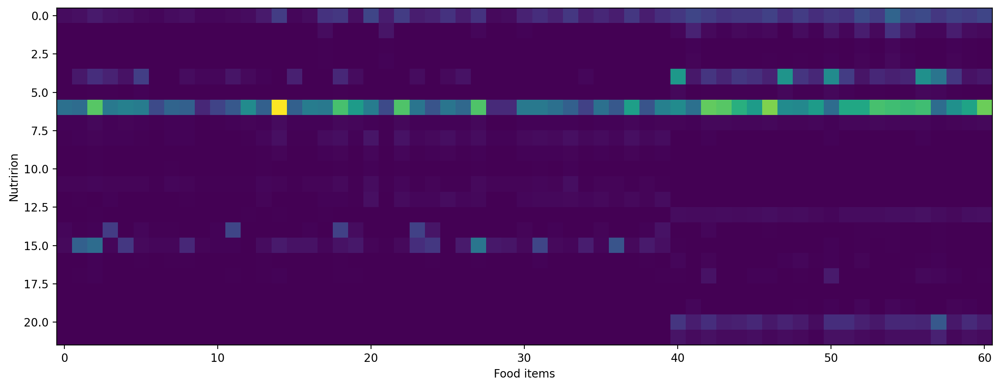

2 random dimensions distribution


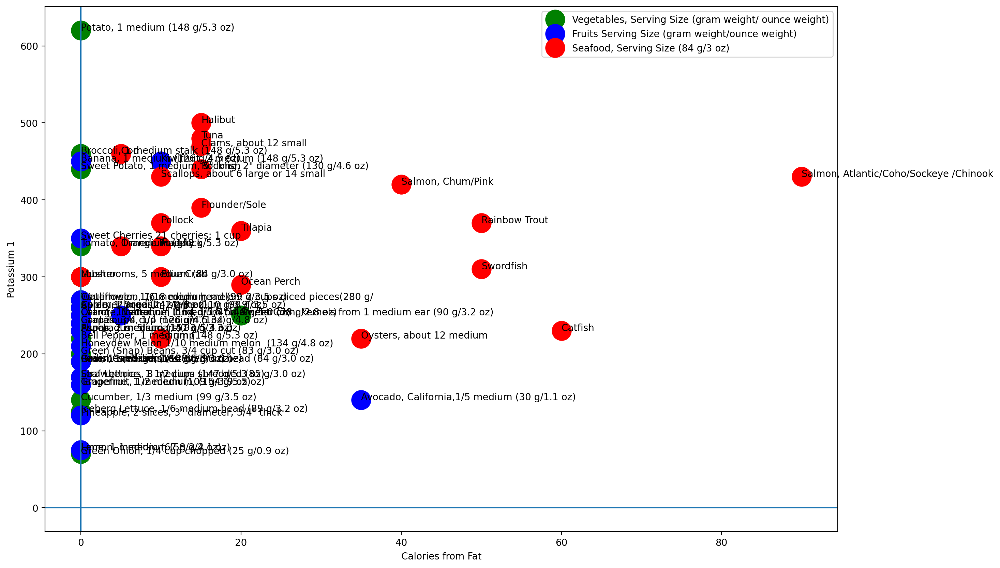

In [ ]:
A = dataset.to_numpy()[1:,1:-1].astype('float64')
print("Raw matrix values, columns are objects", A.shape)
show_matrix(A.T, "Food items", "Nutririon")

print("2 random dimensions distribution")
show_points_2d(A.T[1], A.T[6], dimensions[1], dimensions[6])

Suppose we have matrix $X$, where rows are observation and columns are features of the observation. We want to reduse the dimension of feature to $d$. We will be looking for a new basis $U$, which meet the following requirments:
1. <$u_i$,  $u_j$ > = 0
2. <$u_i$,  $u_i$ > = 1
3. When projecting the samples onto components $u_1, \dots, u_d$ we obtain the maximal dispersion among all possible ways to choose the $d$ components

The dispersion of the samples projected onto new basis is $\sum ||Xu_i ||^2$. We want to maximize the dispersion for every component. Let's do it for the first component.

The problem is the following:

$$
||Xu_1 ||^2 → max\\
||u_1||^2 = 1
$$

We compute the Lagrangian
$$
L(u_1, \lambda) = <Xu_1, Xu_1> + \lambda (<u_1>-1)\\
\frac{\delta L}{\delta u_1} = 2Xu_1+ 2\lambda u_1
$$

We can see that $u_1$ is the eigenvector of $X^T X$

$$
||Xu_1 ||^2  = <Xu_1, Xu_1> = \lambda <u_1, u_1> = \lambda → max\\

$$

Thus $\lambda$ must be a maximal eigenvalue.

How to solve the problem for $u_2$?

##**PCA Algoritm**

1) Center the data

$$
\overline{X} = X - \mu
$$

 $\mu$ is a feature's average

2) Build the covariation matrix from $X_{centered}$ of size $n \times m$. $n$ -number of observation, $m$ - number of features.

$$
 Σ = \frac{1}{n-1} \overline{X}^{\top} \overline{X}
$$


3)  eigendecomposition for$Σ$

$$
Σ = V^{-1} Λ V
$$

 $V$ is eigenvectors, and $\Lambda$ diagonal matrix with eigenvalues.

4) Sort eigenvalues.

5) Take the first  $k$ vectors of $k$ biggest eigenvalues

$$
W = V[:, :k] Λ[:, :k]
$$

6) Project the data on new basis

$$
T = \overline{X} W
$$

#**Eigen Decomposition**

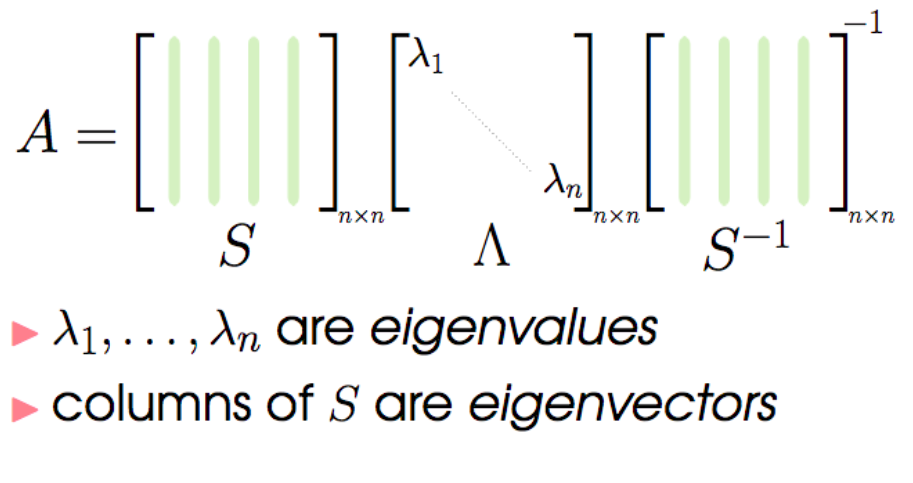

In [ ]:
def centered(A):
    C = A.copy()
    centers = np.mean(A, axis=0)
    C = A.T - centers.reshape((22,1))
    return C.T

Ac = centered(A)

assert np.allclose(np.mean(Ac, axis=0), np.zeros((22, 1))), "After centering, average value of the column should be equal to 0"



In [ ]:
def covariance_matrix(Ac):
  n, m = Ac.shape
  cov = ...
  return cov.astype('float64')

cov1 = covariance_matrix(Ac)

assert np.linalg.norm(cov1-np.cov(Ac.T)) <10**(-10)

In [ ]:
eigenvalues, eigenvectors = np.linalg.eig(cov1)
assert np.isclose(np.linalg.norm(eigenvalues[0] * eigenvectors[:, 0] - cov1 @ eigenvectors[:, 0]), 0)

You can use the default function to compute eigenvalue decomposition, or use this nice algorithm.

## QR algorithm

Consider Eigen Decomposition

$$
A = Q T Q^{*}
$$

We can rewrite it the following way

$$
Q T = A Q
$$

We can write down the iterative process

$$
Q_{k+1} R_{k+1}  = A Q_{k}, \: \: \: \: \: \: \: \: Q^{*}_{k+1}  A  =R_{k+1}  Q^{*}_{k}
$$

Introduce

$$
A_k = Q^{*}_{k} A Q_{k} = Q^{*}_{k} Q_{k+1} R_{k+1} = 	\widehat{Q}_{k} R_{k+1}
$$

And the new approximation

$$
A_{k+1} = Q^{*}_{k+1} A Q_{k+1} = (Q^{*}_{k+1}  A  =R_{k+1}) =  R_{k+1} \widehat{Q}_{k}
$$

## SO we can come up with the QR algoritm

1) Set $A_0 = A$


2) Compute QR factorization $A_k = Q_k R_k$




3) Set $A_{k+1} = R_k Q_k $

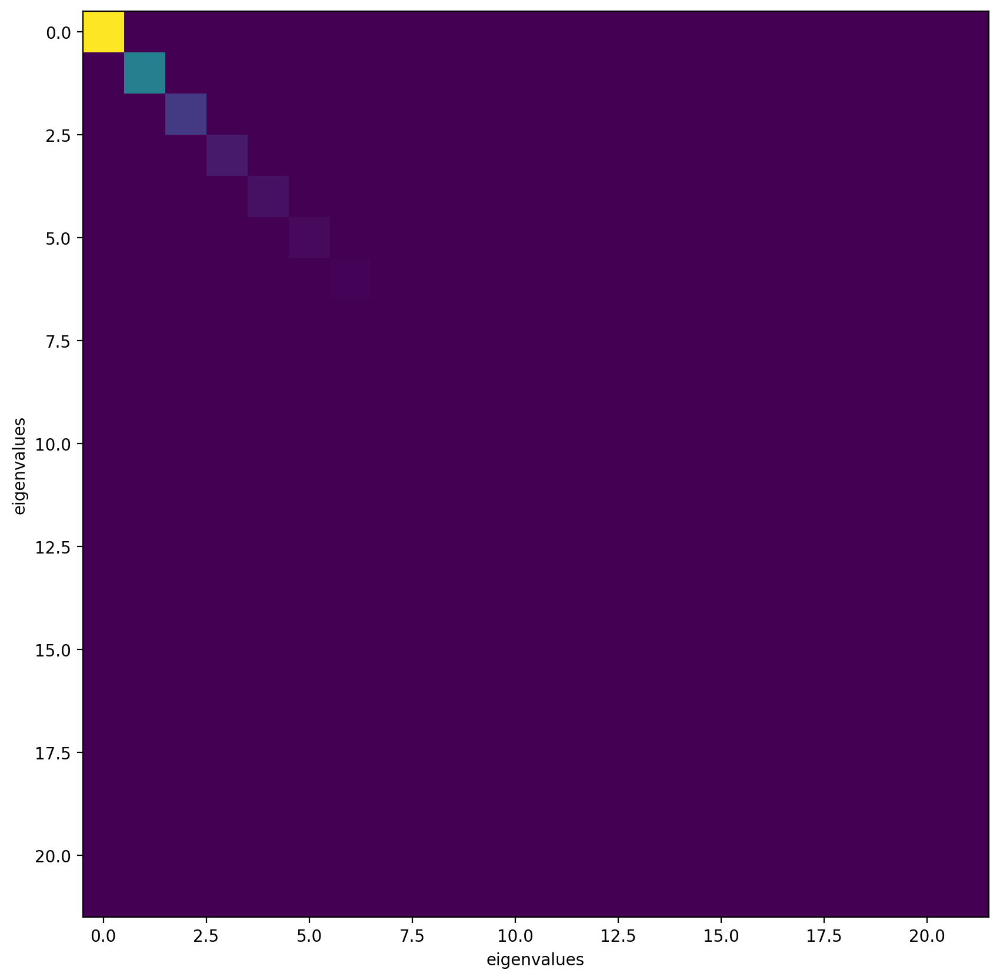

In [ ]:
def QR_algorithm(X, iters=10000):
    A = X.copy()
    PQ = np.eye(A.shape[0])
    for i in range(iters):
        Q, R = ...


    return np.diag(A), PQ

eigenvalues, eigenvectors = QR_algorithm(cov1)
assert np.isclose(np.linalg.norm(eigenvalues[0] * eigenvectors[:, 0] - cov1 @ eigenvectors[:, 0]), 0),  "This was pretty simple eigenvalues test. And you failed even the test :("

show_matrix(np.diag(eigenvalues), "eigenvalues", "eigenvalues")

2 first dimensions


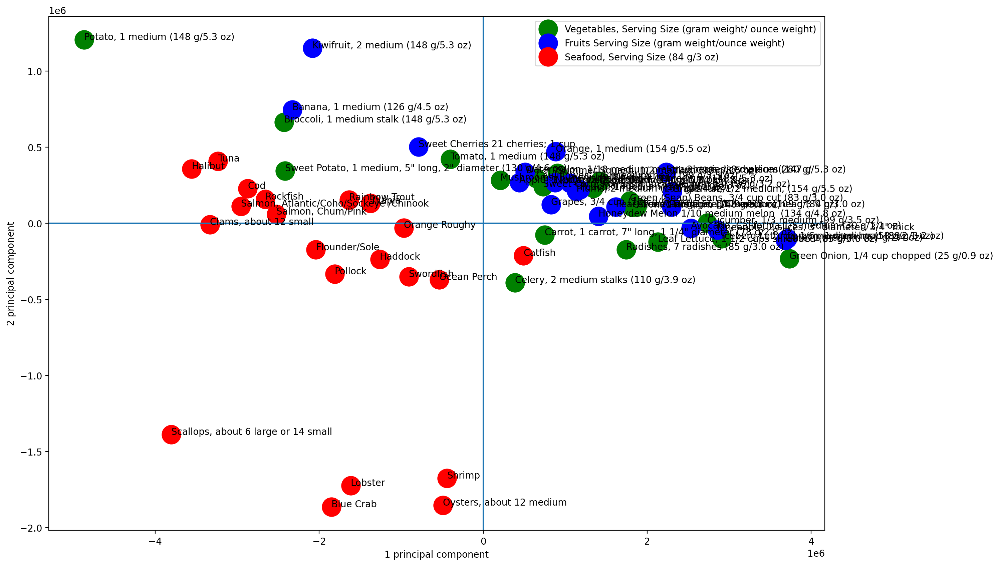

3 first dimensions


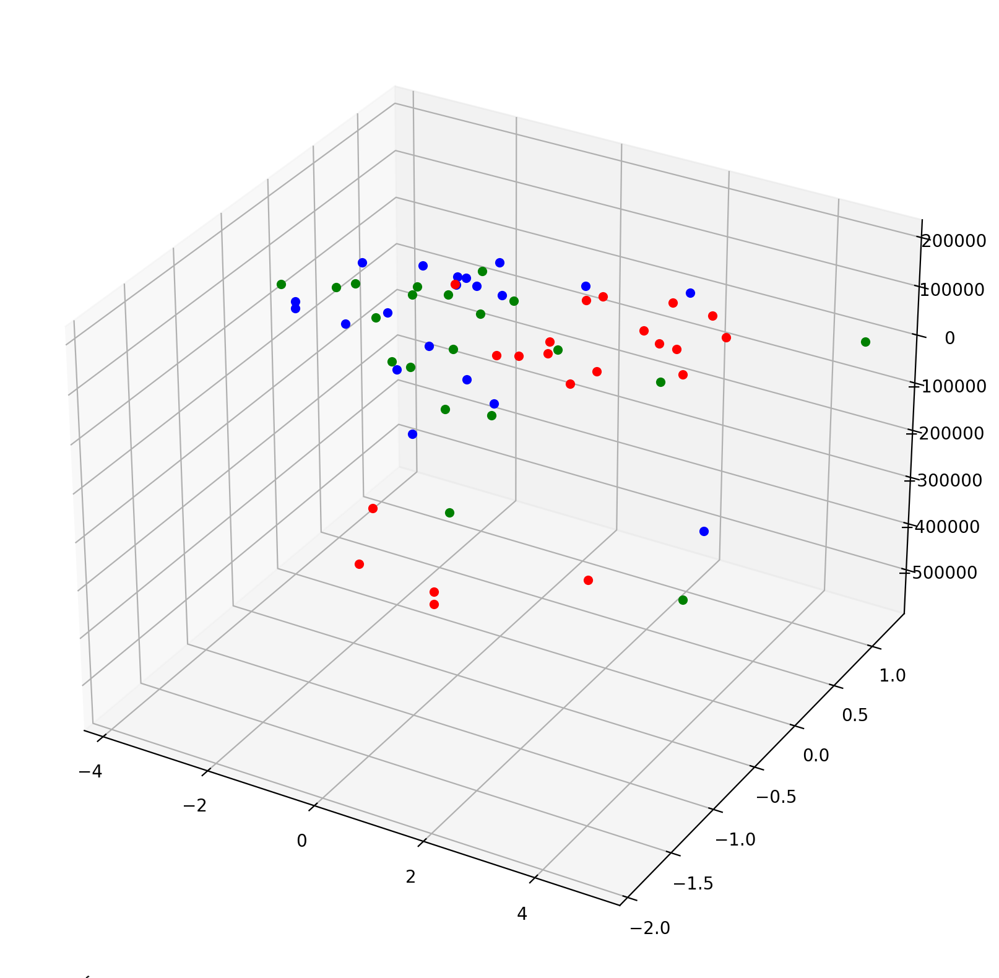

In [ ]:
k = 3

# this matrix has a size (items)x(k) and represent our food items in less-dimensional (k-dimensional) space
# in this new space the smaller the column index, the more valuable the component
W =  eigenvectors[:, :k] @ np.diag(eigenvalues)[:k,:k]
Ak = Ac @ W


print("2 first dimensions")
show_points_2d(-Ak.T[0], Ak.T[1], "1 principal component", "2 principal component")
print("3 first dimensions")
show_points_3d(Ak.T[0],Ak.T[1], Ak.T[2])

# OK THEN, BUT WHERE IS SVD?

We can use SVD instead of eigenvalue decomposition. It works because of
 **Eckart-Young-Mirsky theorem**

 ## Eckart-Young-Mirsky theorem

 Let $A \in R^{m \times n }$ and $A=USV^T$. Define $A_k$ as $A_k = \sum_{1}^k \sigma_i u_i v_i$. $A_k$ solves the optimization problem

 $$
 \min_{\texttt{B of rank k}} ||A - B||_2
 $$

 furthermore
 $$
 || A - A_k || = \sigma_{k+1}
 $$

In order to compute PCA via SVD:

1. Compute SVD for centered matrix A
2. Truncate $U$ and $\Sigma$ factors
3. Use the multiplication of $U$ and $\Sigma$ as k rank approximation of the initial matrix

In [ ]:
u, s, v = ...

2 first dimensions


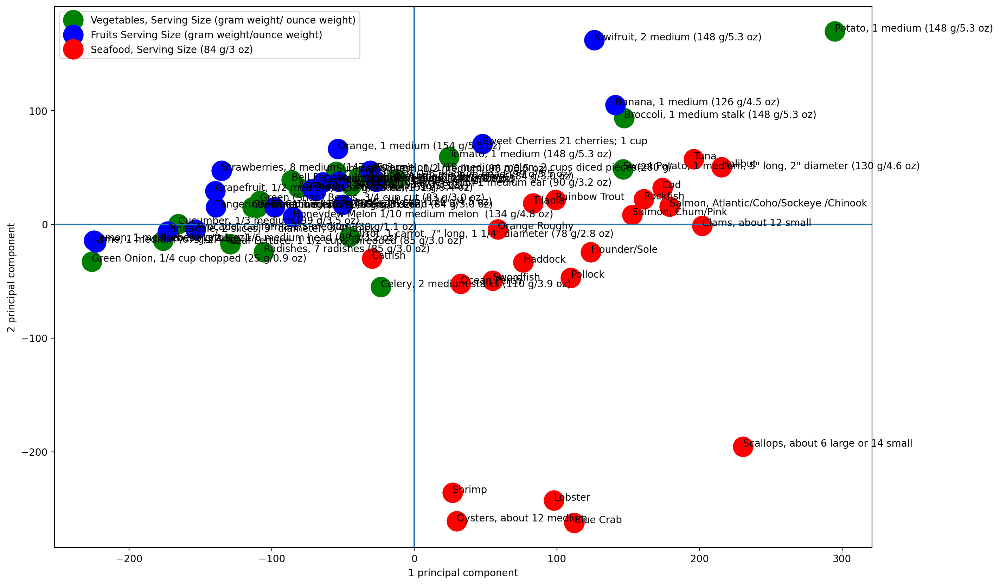

3 first dimensions


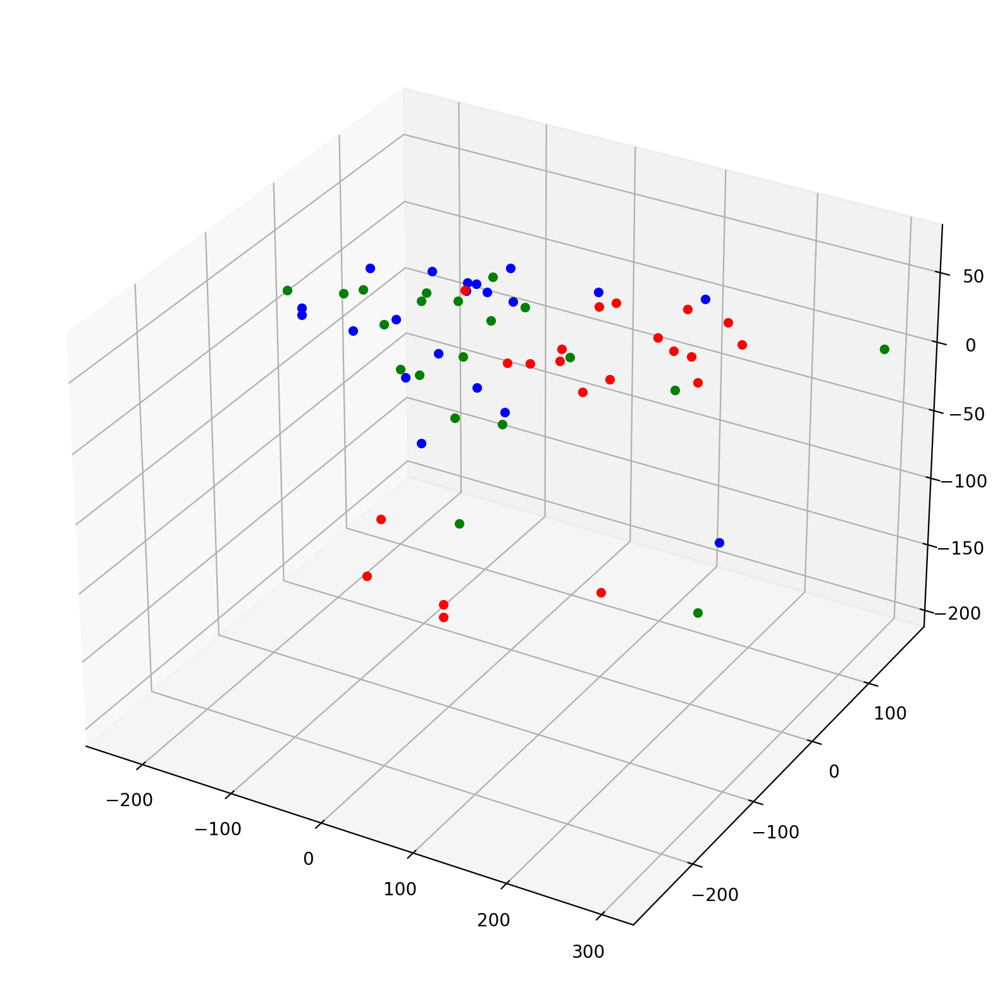

In [ ]:
k = 3

Ak =   ...

Ak = Ak.real



print("2 first dimensions")
show_points_2d(Ak.T[0], Ak.T[1], "1 principal component", "2 principal component")
print("3 first dimensions")
show_points_3d(Ak.T[0], Ak.T[1], Ak.T[2])